In [1]:
import modin.pandas as pd
from modin.config import Engine
Engine.put("dask") 

In [2]:
import os
import daal4py as d4p
from xgboost import XGBClassifier
import time
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
warnings.filterwarnings('ignore')
pio.renderers.default='notebook' 
intel_pal, color=['#0071C5','#FCBB13'], ['#7AB5E1','#FCE7B2']
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), 
                           height=500, width=1000))
df = pd.read_csv('dataset.csv')
df.head()

,Index,pH,Iron,Nitrate,Chloride,Lead,Zinc,Color,Turbidity,Fluoride,...,Chlorine,Manganese,Total Dissolved Solids,Source,Water Temperature,Air Temperature,Month,Day,Time of Day,Target
0,0,8.332988,0.000083,8.605777,122.799772,3.713298e-52,3.434827,Colorless,0.022683,0.607283,...,3.708178,2.269945e-15,332.118789,NaN,NaN,43.493324,January,29.0,4.0,0
1,1,6.917863,0.000081,3.734167,227.029851,7.849262e-94,1.245317,Faint Yellow,0.019007,0.622874,...,3.292038,8.024076e-07,284.641984,Lake,15.348981,71.220586,November,26.0,16.0,0
2,2,5.443762,0.020106,3.816994,230.995630,5.286616e-76,0.528280,Light Yellow,0.319956,0.423423,...,3.560224,7.007989e-02,570.054094,River,11.643467,44.891330,January,31.0,8.0,0
3,3,7.955339,0.143988,8.224944,178.129940,3.997118e-176,4.027879,Near Colorless,0.166319,0.208454,...,3.516907,2.468295e-02,100.043838,Ground,10.092392,60.843233,April,1.0,21.0,0
4,4,8.091909,0.002167,9.925788,186.540872,4.171069e-132,3.807511,Light Yellow,0.004867,0.222912,...,3.177849,3.296139e-03,168.075545,Spring,15.249416,69.336671,June,29.0,7.0,0


In [4]:
print("Data shape: {}\n".format(df.shape))

Data shape: (5956842, 24)



In [5]:
display(df.isna().sum())
missing=df.isna().sum().sum()
duplicates=df.duplicated().sum()
print("\nThere are {:,.0f} missing values in the data.".format(missing))
print("There are {:,.0f} duplicate records in the data.".format(duplicates))

Index                          0
pH                        116054
Iron                       39753
Nitrate                   105725
Chloride                  175531
Lead                       26909
Zinc                      156126
Color                       5739
Turbidity                  49815
Fluoride                  189156
Copper                    199402
Odor                      178891
Sulfate                   197418
Conductivity              163861
Chlorine                   57825
Manganese                 109583
Total Dissolved Solids      1670
Source                     88262
Water Temperature         168233
Air Temperature            29728
Month                      95668
Day                        99603
Time of Day               114519
Target                         0
dtype: int64


There are 2,369,471 missing values in the data.
There are 0 duplicate records in the data.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5956842 entries, 0 to 5956841
Data columns (total 24 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   Index                   int64  
 1   pH                      float64
 2   Iron                    float64
 3   Nitrate                 float64
 4   Chloride                float64
 5   Lead                    float64
 6   Zinc                    float64
 7   Color                   object 
 8   Turbidity               float64
 9   Fluoride                float64
 10  Copper                  float64
 11  Odor                    float64
 12  Sulfate                 float64
 13  Conductivity            float64
 14  Chlorine                float64
 15  Manganese               float64
 16  Total Dissolved Solids  float64
 17  Source                  object 
 18  Water Temperature       float64
 19  Air Temperature         float64
 20  Month                   object 
 21  Day                     float64

In [7]:
df.describe()

,Index,pH,Iron,Nitrate,Chloride,Lead,Zinc,Turbidity,Fluoride,Copper,...,Sulfate,Conductivity,Chlorine,Manganese,Total Dissolved Solids,Water Temperature,Air Temperature,Day,Time of Day,Target
count,5.956842e+06,5.840788e+06,5.917089e+06,5.851117e+06,5.781311e+06,5.929933e+06,5.800716e+06,5.907027e+06,5.767686e+06,5.757440e+06,...,5.759424e+06,5.792981e+06,5.899017e+06,5.847259e+06,5.955172e+06,5.788609e+06,5.927114e+06,5.857239e+06,5.842323e+06,5.956842e+06
mean,2.978420e+06,7.445373e+00,1.279027e-01,6.169970e+00,1.842970e+02,1.498336e-03,1.550255e+00,5.215093e-01,9.644315e-01,5.161216e-01,...,1.460764e+02,4.249974e+02,3.255738e+00,1.092802e-01,2.671454e+02,1.912982e+01,6.000324e+01,1.573227e+01,1.150404e+01,3.030552e-01
std,1.719592e+06,8.881665e-01,4.799915e-01,3.256667e+00,6.842828e+01,3.250641e-02,1.546368e+00,9.258807e-01,8.247870e-01,5.965534e-01,...,6.879844e+01,1.899937e+02,7.328441e-01,4.761827e-01,1.558586e+02,1.136623e+01,1.809977e+01,8.794391e+00,6.922858e+00,4.595789e-01
min,0.000000e+00,1.057113e+00,2.047587e-53,2.861727e-01,2.363919e+01,0.000000e+00,1.482707e-08,1.029712e-16,4.550148e-06,2.982735e-10,...,1.194073e+01,1.059998e+01,9.019921e-01,4.793505e-55,1.048902e-02,6.661938e-01,-3.387091e+01,1.000000e+00,0.000000e+00,0.000000e+00
25%,1.489210e+06,6.894328e+00,9.992949e-06,3.973078e+00,1.381341e+02,1.500283e-122,4.148202e-01,3.872368e-02,3.749503e-01,1.288629e-01,...,9.777114e+01,2.864261e+02,2.744504e+00,2.522376e-06,1.329157e+02,1.134879e+01,4.779120e+01,8.000000e+00,6.000000e+00,0.000000e+00
50%,2.978420e+06,7.449564e+00,2.249640e-03,5.604051e+00,1.760178e+02,2.213625e-62,1.081818e+00,2.097680e-01,7.751792e-01,3.479592e-01,...,1.346489e+02,3.970808e+02,3.209748e+00,6.481943e-04,2.658880e+02,1.644428e+01,5.999681e+01,1.600000e+01,1.200000e+01,0.000000e+00
75%,4.467631e+06,8.014424e+00,5.455290e-02,7.672402e+00,2.179811e+02,3.592165e-27,2.230841e+00,6.249132e-01,1.341508e+00,7.010104e-01,...,1.817703e+02,5.333489e+02,3.705217e+00,1.672082e-02,3.984954e+02,2.383543e+01,7.221235e+01,2.300000e+01,1.800000e+01,1.000000e+00
max,5.956841e+06,1.291072e+01,1.935315e+01,9.639078e+01,1.507310e+03,5.844281e+00,2.836867e+01,2.371527e+01,1.464625e+01,1.207482e+01,...,1.434587e+03,2.271632e+03,1.256663e+01,2.374086e+01,5.797999e+02,2.973086e+02,1.521237e+02,3.100000e+01,2.300000e+01,1.000000e+00


In [8]:
df.fillna(df.mean(), inplace=True)

In [9]:
df.head()

,Index,pH,Iron,Nitrate,Chloride,Lead,Zinc,Color,Turbidity,Fluoride,...,Chlorine,Manganese,Total Dissolved Solids,Source,Water Temperature,Air Temperature,Month,Day,Time of Day,Target
0,0,8.332988,0.000083,8.605777,122.799772,3.713298e-52,3.434827,Colorless,0.022683,0.607283,...,3.708178,2.269945e-15,332.118789,NaN,19.129818,43.493324,January,29.0,4.0,0
1,1,6.917863,0.000081,3.734167,227.029851,7.849262e-94,1.245317,Faint Yellow,0.019007,0.622874,...,3.292038,8.024076e-07,284.641984,Lake,15.348981,71.220586,November,26.0,16.0,0
2,2,5.443762,0.020106,3.816994,230.995630,5.286616e-76,0.528280,Light Yellow,0.319956,0.423423,...,3.560224,7.007989e-02,570.054094,River,11.643467,44.891330,January,31.0,8.0,0
3,3,7.955339,0.143988,8.224944,178.129940,3.997118e-176,4.027879,Near Colorless,0.166319,0.208454,...,3.516907,2.468295e-02,100.043838,Ground,10.092392,60.843233,April,1.0,21.0,0
4,4,8.091909,0.002167,9.925788,186.540872,4.171069e-132,3.807511,Light Yellow,0.004867,0.222912,...,3.177849,3.296139e-03,168.075545,Spring,15.249416,69.336671,June,29.0,7.0,0


In [10]:
df.isnull().sum()

Index                         0
pH                            0
Iron                          0
Nitrate                       0
Chloride                      0
Lead                          0
Zinc                          0
Color                      5739
Turbidity                     0
Fluoride                      0
Copper                        0
Odor                          0
Sulfate                       0
Conductivity                  0
Chlorine                      0
Manganese                     0
Total Dissolved Solids        0
Source                    88262
Water Temperature             0
Air Temperature               0
Month                     95668
Day                           0
Time of Day                   0
Target                        0
dtype: int64

In [11]:
def display_stats(df):
    df=df.describe()
    skewness=df.skew()
    kurtosis=df.kurtosis()
    df=df.append([skewness, kurtosis],ignore_index=True)
    idx=pd.Series(['count','mean','std','min','25%','50%','75%','max','skewness','kurtosis'],name='Summary Statistic')
    df=pd.concat([df,idx],1).set_index('Summary Statistic')
    display(df.style.format('{:,.3f}').background_gradient(subset=(df.index[1:],df.columns[:]), cmap='GnBu'))

display_stats(df)

,Index,pH,Iron,Nitrate,Chloride,Lead,Zinc,Turbidity,Fluoride,Copper,Odor,Sulfate,Conductivity,Chlorine,Manganese,Total Dissolved Solids,Water Temperature,Air Temperature,Day,Time of Day,Target
Summary Statistic,,,,,,,,,,,,,,,,,,,,,
count,"5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000","5,956,842.000"
mean,"2,978,420.500",7.445,0.128,6.170,184.297,0.001,1.550,0.522,0.964,0.516,1.803,146.076,424.997,3.256,0.109,267.145,19.130,60.003,15.732,11.504,0.303
std,"1,719,592.310",0.879,0.478,3.228,67.413,0.032,1.526,0.922,0.812,0.586,1.053,67.649,187.362,0.729,0.472,155.837,11.205,18.055,8.721,6.856,0.460
min,0.000,1.057,0.000,0.286,23.639,0.000,0.000,0.000,0.000,0.000,0.011,11.941,10.600,0.902,0.000,0.010,0.666,-33.871,1.000,0.000,0.000
25%,"1,489,210.250",6.906,0.000,4.003,139.351,0.000,0.429,0.040,0.387,0.135,0.919,99.035,289.656,2.750,0.000,132.953,11.492,47.862,8.000,6.000,0.000
50%,"2,978,420.500",7.445,0.002,5.667,178.334,0.000,1.127,0.214,0.805,0.367,1.803,137.361,403.564,3.219,0.001,265.963,16.778,60.003,15.732,11.504,0.000
75%,"4,467,630.750",8.002,0.058,7.626,216.509,0.000,2.187,0.620,1.318,0.685,2.627,179.733,528.446,3.700,0.019,398.455,23.541,72.142,23.000,17.000,1.000
max,"5,956,841.000",12.911,19.353,96.391,"1,507.310",5.844,28.369,23.715,14.646,12.075,4.142,"1,434.587","2,271.632",12.567,23.741,579.800,297.309,152.124,31.000,23.000,1.000
skewness,0.068,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828,2.828


In [12]:
def plot_target_dist(target_col):
    target=df[target_col].value_counts(normalize=True)
    target.rename(index={1:'State 1',0:'State 0'},inplace=True)
    fig=go.Figure()
    fig.add_trace(go.Pie(labels=target.index, values=target*100, hole=.45, 
                         text=target.index, sort=False, showlegend=False,
                         marker=dict(colors=color,line=dict(color=intel_pal,width=2.5)),
                         hovertemplate = "%{label}: <b>%{value:.2f}%</b><extra></extra>"))
    fig.update_layout(template=temp, title='Target Distribution',width=700,height=450,
                      uniformtext_minsize=15, uniformtext_mode='hide')
    fig.show() 
    
plot_target_dist(target_col='Target')

IndexError: list index out of range

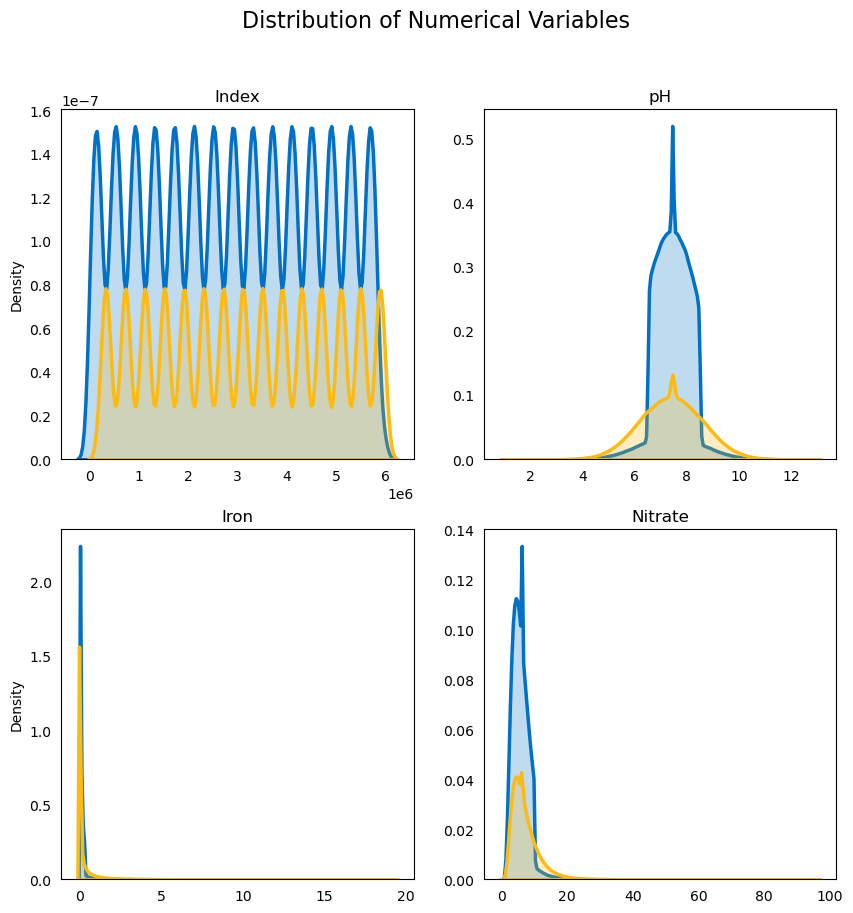

In [13]:
cat_cols,float_cols=[],['Target']
for col in df.columns:
    if df[col].value_counts().count()<10:
        cat_cols.append(col)
    else:
        float_cols.append(col)
        
plot_df=df[float_cols]
fig, ax = plt.subplots(2,2, figsize=(10,10))
fig.suptitle('Distribution of Numerical Variables',fontsize=16)
row=0
col=[0,1]*2
for i, column in enumerate(plot_df.columns[1:]):
    if (i!=0)&(i%2==0):
        row+=1
    sns.kdeplot(x=column, hue='Target', palette=intel_pal[::-1], hue_order=[1,0], label=['State 1','State 0'], data=plot_df, fill=True, linewidth=2.5, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False, bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%2==0 else ''))

handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['State 1','State 0'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.99))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5956842 entries, 0 to 5956841
Data columns (total 24 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   Index                   int64  
 1   pH                      float64
 2   Iron                    float64
 3   Nitrate                 float64
 4   Chloride                float64
 5   Lead                    float64
 6   Zinc                    float64
 7   Color                   object 
 8   Turbidity               float64
 9   Fluoride                float64
 10  Copper                  float64
 11  Odor                    float64
 12  Sulfate                 float64
 13  Conductivity            float64
 14  Chlorine                float64
 15  Manganese               float64
 16  Total Dissolved Solids  float64
 17  Source                  object 
 18  Water Temperature       float64
 19  Air Temperature         float64
 20  Month                   object 
 21  Day                     float64

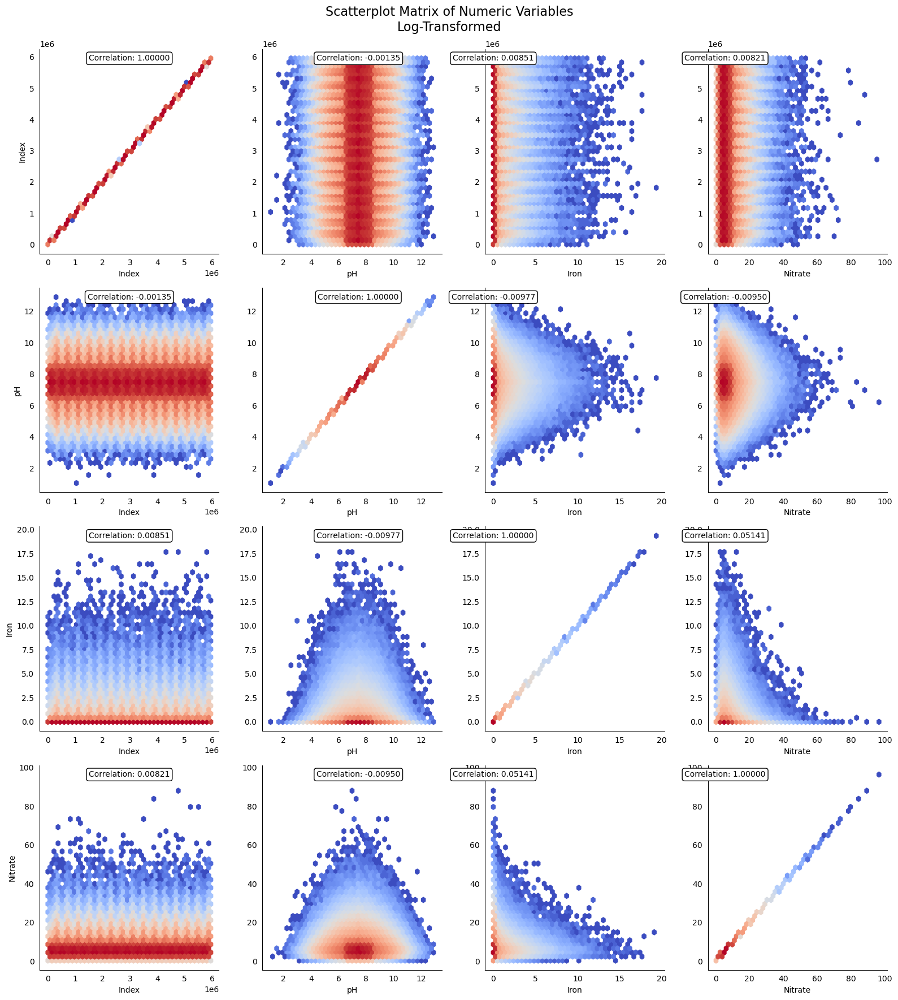

In [15]:
plot_df=df[float_cols]
fig, ax = plt.subplots(4,4, figsize=(16,18))
fig.suptitle('Scatterplot Matrix of Numeric Variables\nLog-Transformed',fontsize=16)
for i, col in enumerate(float_cols[1:5]):
    for j, iter_col in enumerate(float_cols[1:5]):
        ax[i,j].hexbin(x=iter_col, y=col, data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
        ax[i,j].set(xlabel=iter_col, ylabel=(col if j%4==0 else ''))
        ax[i,j].text(plot_df[iter_col].median(), plot_df[col].max(), 'Correlation: {:.5f}'.format(plot_df[[col,iter_col]].corr().iloc[1,0]), ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
        ax[i,j].tick_params(left=False,bottom=False)    

sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

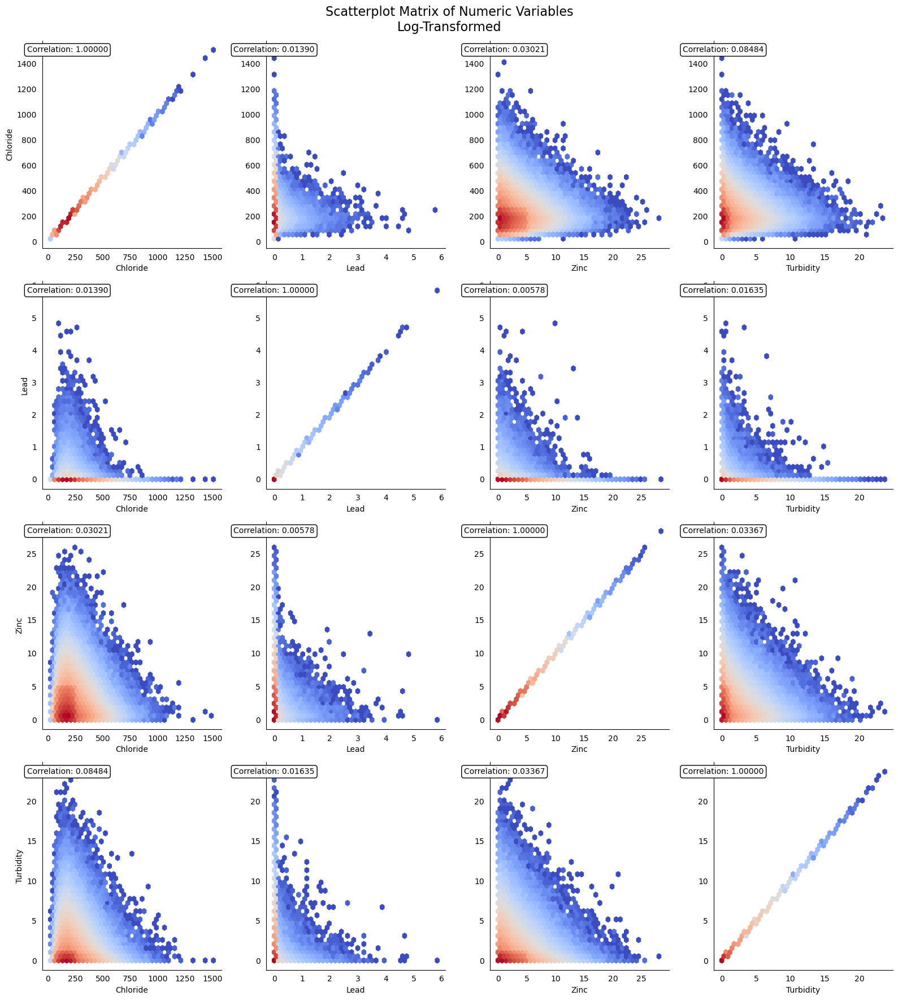

In [16]:
plot_df=df[float_cols]
fig, ax = plt.subplots(4,4, figsize=(16,18))
fig.suptitle('Scatterplot Matrix of Numeric Variables\nLog-Transformed',fontsize=16)
for i, col in enumerate(float_cols[5:9]):
    for j, iter_col in enumerate(float_cols[5:9]):
        ax[i,j].hexbin(x=iter_col, y=col, data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
        ax[i,j].set(xlabel=iter_col, ylabel=(col if j%4==0 else ''))
        ax[i,j].text(plot_df[iter_col].median(), plot_df[col].max(), 'Correlation: {:.5f}'.format(plot_df[[col,iter_col]].corr().iloc[1,0]), ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
        ax[i,j].tick_params(left=False,bottom=False)    

sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

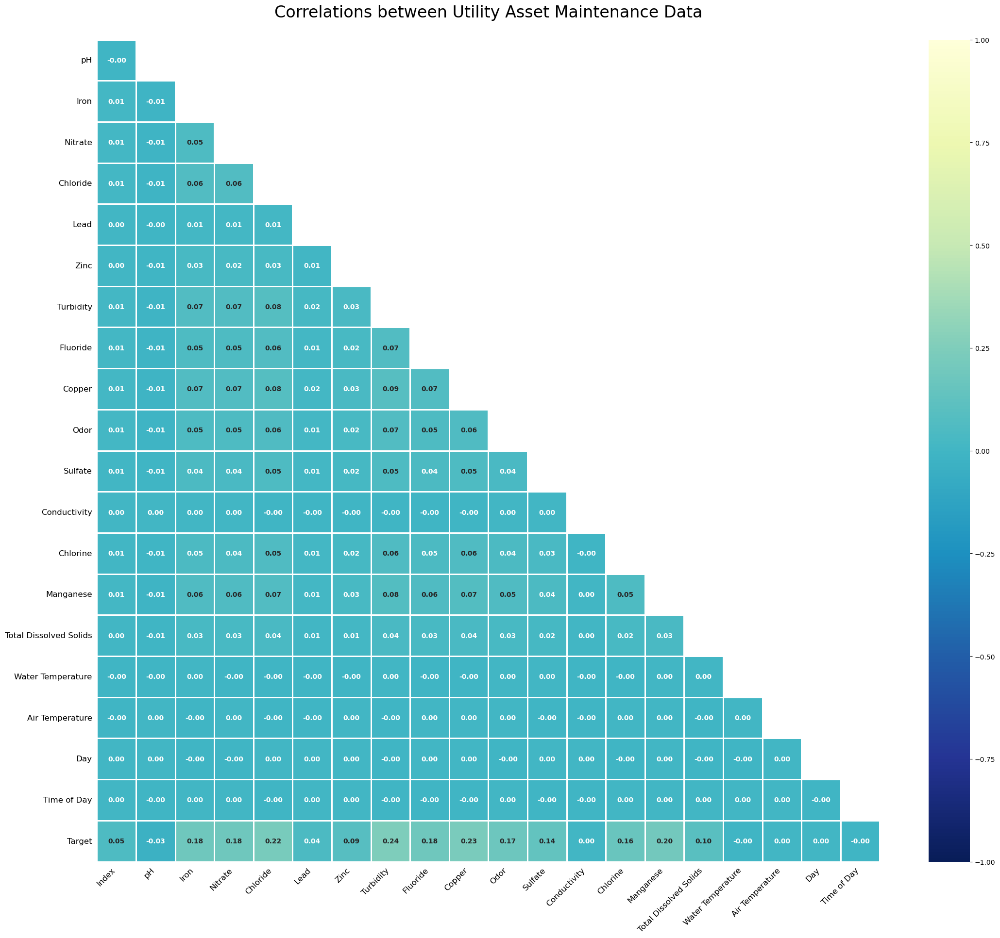

In [17]:
def plot_corr(corr):
    mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
    corr=corr.iloc[1:,:-1].copy()
    fig, ax = plt.subplots(figsize=(26,22))   
    sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', cmap='YlGnBu_r',lw=2, annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=True)
    ax.tick_params(left=False,bottom=False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(),fontsize=12)
    plt.title('Correlations between Utility Asset Maintenance Data\n', fontsize=24)
    plt.show()
    
def plot_target_corr(corr, target_col): 
    corr=corr[target_col].sort_values(ascending=False)[1:]
    pal=sns.color_palette("RdYlBu",37).as_hex()
    pal=[j for i,j in enumerate(pal) if i not in (17,18)]
    rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.8)) for i in pal] 
    
    fig=go.Figure()
    fig.add_trace(go.Bar(x=corr.index, y=corr, marker_color=rgb, marker_line=dict(color=pal,width=2), hovertemplate='%{x} correlation with Target = %{y}', showlegend=False, name=''))
    fig.update_layout(template=temp, title='Feature Correlations with Target (Target)', yaxis_title='Correlation', margin=dict(b=160), xaxis_tickangle=45)
    fig.show()
    
corr = df.corr()
plot_corr(corr=corr)
plot_target_corr(corr=corr, target_col='Target')

In [18]:
def prepare_train_test_data(data, target_col, test_size):
    scaler = RobustScaler()   
    X = df.drop(target_col, axis=1)
    y = df[target_col]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=21)
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    print("Train Shape: {}".format(X_train_scaled.shape))
    print("Test Shape: {}".format(X_test_scaled.shape))
    return X_train_scaled, X_test_scaled, y_train, y_test

def plot_model_res(model_name, y_test, y_prob):
    intel_pal=['#0071C5','#FCBB13']
    color=['#7AB5E1','#FCE7B2']
    
    ## ROC & PR Curve ##
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr,tpr)
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    auprc = average_precision_score(y_test, y_prob)
    
    fig = make_subplots(rows=1, cols=2, 
                        shared_yaxes=True, 
                        subplot_titles=['Receiver Operating Characteristic<br>(ROC) Curve',
                                        'Precision-Recall Curve<br>AUPRC = {:.3f}'.format(auprc)])
    
    fig.add_trace(go.Scatter(x=np.linspace(0,1,11), y=np.linspace(0,1,11), 
                             name='Baseline',mode='lines',legendgroup=1,
                             line=dict(color="Black", width=1, dash="dot")), row=1,col=1)    
    fig.add_trace(go.Scatter(x=fpr, y=tpr, line=dict(color=intel_pal[0], width=3), 
                             hovertemplate = 'True positive rate = %{y:.3f}, False positive rate = %{x:.3f}',
                             name='AUC = {:.4f}'.format(roc_auc),legendgroup=1), row=1,col=1)
    fig.add_trace(go.Scatter(x=recall, y=precision, line=dict(color=intel_pal[0], width=3), 
                             hovertemplate = 'Precision = %{y:.3f}, Recall = %{x:.3f}',
                             name='AUPRC = {:.4f}'.format(auprc),showlegend=False), row=1,col=2)
    fig.update_layout(template=temp, title="{} ROC and Precision-Recall Curves".format(model_name), 
                      hovermode="x unified", width=900,height=500,
                      xaxis1_title='False Positive Rate (1 - Specificity)',
                      yaxis1_title='True Positive Rate (Sensitivity)',
                      xaxis2_title='Recall (Sensitivity)',yaxis2_title='Precision (PPV)',
                      legend=dict(orientation='v', y=.07, x=.45, xanchor="right",
                                  bordercolor="black", borderwidth=.5))
    fig.show()
    
    ## Target Distribution ##     
    plot_df=pd.DataFrame.from_dict({'State 0':(len(y_prob[y_prob<=0.5])/len(y_prob))*100, 
                                    'State 1':(len(y_prob[y_prob>0.5])/len(y_prob))*100}, 
                                   orient='index', columns=['pct'])
    fig=go.Figure()
    fig.add_trace(go.Pie(labels=plot_df.index, values=plot_df.pct, hole=.45, 
                         text=plot_df.index, sort=False, showlegend=False,
                         marker=dict(colors=color,line=dict(color=intel_pal,width=2.5)),
                         hovertemplate = "%{label}: <b>%{value:.2f}%</b><extra></extra>"))
    fig.update_layout(template=temp, title='Predicted Target Distribution',width=700,height=450,
                      uniformtext_minsize=15, uniformtext_mode='hide')
    fig.show()

In [19]:
from sklearnex import patch_sklearn
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [20]:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score, f1_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.svm import SVC

In [21]:
df = df.drop(['Color', 'Source', 'Month'], axis=1)

In [22]:
print("Preparing Train and Test datasets")
X_train, X_test, y_train, y_test = prepare_train_test_data(data=df, target_col='Target', test_size=.25)
parameters = {
    'class_weight': 'balanced',
    'probability': True,
    'random_state': 21}
svc = SVC(**parameters)

strat_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=21)
print("\nTuning hyperparameters..")
grid = {
    'C': np.logspace(-1, 1, 5),
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }
grid_search = RandomizedSearchCV(svc, param_distributions=grid, 
                                    cv=strat_kfold, n_iter=5, scoring='roc_auc', 
                                    verbose=1, n_jobs=-1, random_state=21)
grid_search.fit(X_train, y_train)
    
print("Done!\nBest hyperparameters:", grid_search.best_params_)
print("Best cross-validation AUC: {:.4f}".format(grid_search.best_score_))

svc = grid_search.best_estimator_
svc_prob = svc.predict_proba(X_test)[:,1]
svc_pred = pd.Series(svc.predict(X_test), name='Target')
svc_auc = roc_auc_score(y_test, svc_prob)
svc_f1 = f1_score(y_test, svc_pred)  
   
print("\nTest F1 accuracy: {:.2f}%, AUC: {:.5f}".format(svc_f1*100,svc_auc))
plot_model_res(model_name='SVC', y_test=y_test, y_prob=svc_prob)

Preparing Train and Test datasets
Train Shape: (4467631, 20)
Test Shape: (1489211, 20)

Tuning hyperparameters..
Fitting 3 folds for each of 5 candidates, totalling 15 fits


MemoryError: bad allocation

In [24]:
print("Preparing Train and Test datasets")
X_train, X_test, y_train, y_test = prepare_train_test_data(data=df, target_col='Target', test_size=.25)
    
ratio = float(np.sum(y_train == 0)) / np.sum(y_train == 1)
parameters = {'scale_pos_weight': ratio.round(2), 'tree_method': 'hist', 'random_state': 21}
xgb_model = XGBClassifier(**parameters)

strat_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=21)
print("\nTuning hyperparameters..")
grid = {'min_child_weight': [1, 5, 10], 'gamma': [0.5, 1, 1.5, 2, 5], 'max_depth': [3, 4, 5],}

grid_search = GridSearchCV(xgb_model, param_grid=grid, cv=strat_kfold, scoring='roc_auc', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Done!\nBest hyperparameters:", grid_search.best_params_)
print("Best cross-validation AUC: {:.4f}".format(grid_search.best_score_))
    
xgb = grid_search.best_estimator_
daal_model = d4p.get_gbt_model_from_xgboost(xgb.get_booster())

daal_prob = d4p.gbt_classification_prediction(nClasses=2,
    resultsToEvaluate="computeClassLabels|computeClassProbabilities",
    fptype='float').compute(X_test, daal_model).probabilities # or .predictions
xgb_pred = pd.Series(np.where(daal_prob[:,1]>.5, 1, 0), name='Target')
xgb_auc = roc_auc_score(y_test, daal_prob[:,1])
xgb_f1 = f1_score(y_test, xgb_pred)  
    
print("\nTest F1 Accuracy: {:.2f}%, AUC: {:.5f}".format(xgb_f1*100, xgb_auc)) 
plot_model_res(model_name='XGBoost', y_test=y_test, y_prob=daal_prob[:,1])

Preparing Train and Test datasets
Train Shape: (4467631, 20)
Test Shape: (1489211, 20)

Tuning hyperparameters..
Fitting 3 folds for each of 45 candidates, totalling 135 fits
Done!
Best hyperparameters: {'gamma': 1.5, 'max_depth': 5, 'min_child_weight': 10}
Best cross-validation AUC: 0.9986

Test F1 Accuracy: 97.56%, AUC: 0.99857
